# Рынок заведений общественного питания Москвы

Мне, как аналитику, дана задача провести исследования рынка общественного питания Москвы. 

Цель моего исследования - найти интересные особенности и презентовать полученные результаты, которые в будущем помогут в выборе подходящего инвесторам места.

## Обзор данных

Доступен датасет с заведениями общественного питания Москвы, составленный на основе данных сервисов Яндекс Карты и Яндекс Бизнес на лето 2022 года.

In [81]:
# импортирую необходимые библиотеки
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import json

! pip install folium
import folium
from folium.plugins import MarkerCluster

! pip install plotly
import plotly
import plotly.graph_objs as go
import plotly.express as px
from plotly.subplots import make_subplots

# для расчета расстояния до центра
! pip install haversine
from haversine import haversine

import scipy.stats as st

import warnings
warnings.filterwarnings('ignore')

In [82]:
# загружаю данные
try:
    data = pd.read_csv('/datasets/moscow_places.csv')
except:
    data = pd.read_csv('moscow_places.csv')

In [83]:
data.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0


In [84]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


В датасете 8406 строк и 14 колонок:
- `name` — название заведения;
- `address` — адрес заведения;
- `category` — категория заведения, например «кафе», «пиццерия» или «кофейня»;
- `hours` — информация о днях и часах работы;
- `lat` — широта географической точки, в которой находится заведение;
- `lng` — долгота географической точки, в которой находится заведение;
- `rating` — рейтинг заведения по оценкам пользователей в Яндекс Картах (высшая оценка — `5.0`);
- `price` — категория цен в заведении, например «средние», «ниже среднего», «выше среднего» и так далее;
- `avg_bill` — строка, которая хранит среднюю стоимость заказа в виде диапазона, например:
    - «Средний счёт: 1000–1500 ₽»;
    - «Цена чашки капучино: 130–220 ₽»;
    - «Цена бокала пива: 400–600 ₽»
        и так далее;
        
- `middle_avg_bill` — число с оценкой среднего чека, которое указано только для значений из столбца `avg_bill`, начинающихся с подстроки «Средний счёт»:
    - Если в строке указан ценовой диапазон из двух значений, в столбец войдёт медиана этих двух значений.
    - Если в строке указано одно число — цена без диапазона, то в столбец войдёт это число.
    - Если значения нет или оно не начинается с подстроки «Средний счёт», то в столбец ничего не войдёт.
- `middle_coffee_cup` — число с оценкой одной чашки капучино, которое указано только для значений из столбца `avg_bill`, начинающихся с подстроки «Цена одной чашки капучино»:
    - Если в строке указан ценовой диапазон из двух значений, в столбец войдёт медиана этих двух значений.
    - Если в строке указано одно число — цена без диапазона, то в столбец войдёт это число.
    - Если значения нет или оно не начинается с подстроки «Цена одной чашки капучино», то в столбец ничего не войдёт.
- `chain` — число, выраженное `0` или `1`, которое показывает, является ли заведение сетевым (для маленьких сетей могут встречаться ошибки);
- `district` — административный район, в котором находится заведение, например Центральный административный округ;
- `seats` — количество посадочных мест.

In [85]:
# проверяю датасет на пропуски
data.isna().sum()

name                    0
category                0
address                 0
district                0
hours                 536
lat                     0
lng                     0
rating                  0
price                5091
avg_bill             4590
middle_avg_bill      5257
middle_coffee_cup    7871
chain                   0
seats                3611
dtype: int64

Найдены пропуски в шести столбцах:
- 536 пропусков в столбце с временем работы;
- 5091 пропуск в столбце с ценовой категорией;
- 4590 пропуск в столбце со средней стоимостью заказа;
- 5257 пропуск в столбце с оценкой среднего чека;
- 7871 пропуск в столбце с средней ценой одной чашки капучино;
- 3611 пропуск в столбце с количеством посадочных мест.

array([[<AxesSubplot: title={'center': 'lat'}>,
        <AxesSubplot: title={'center': 'lng'}>,
        <AxesSubplot: title={'center': 'rating'}>],
       [<AxesSubplot: title={'center': 'middle_avg_bill'}>,
        <AxesSubplot: title={'center': 'middle_coffee_cup'}>,
        <AxesSubplot: title={'center': 'chain'}>],
       [<AxesSubplot: title={'center': 'seats'}>, <AxesSubplot: >,
        <AxesSubplot: >]], dtype=object)

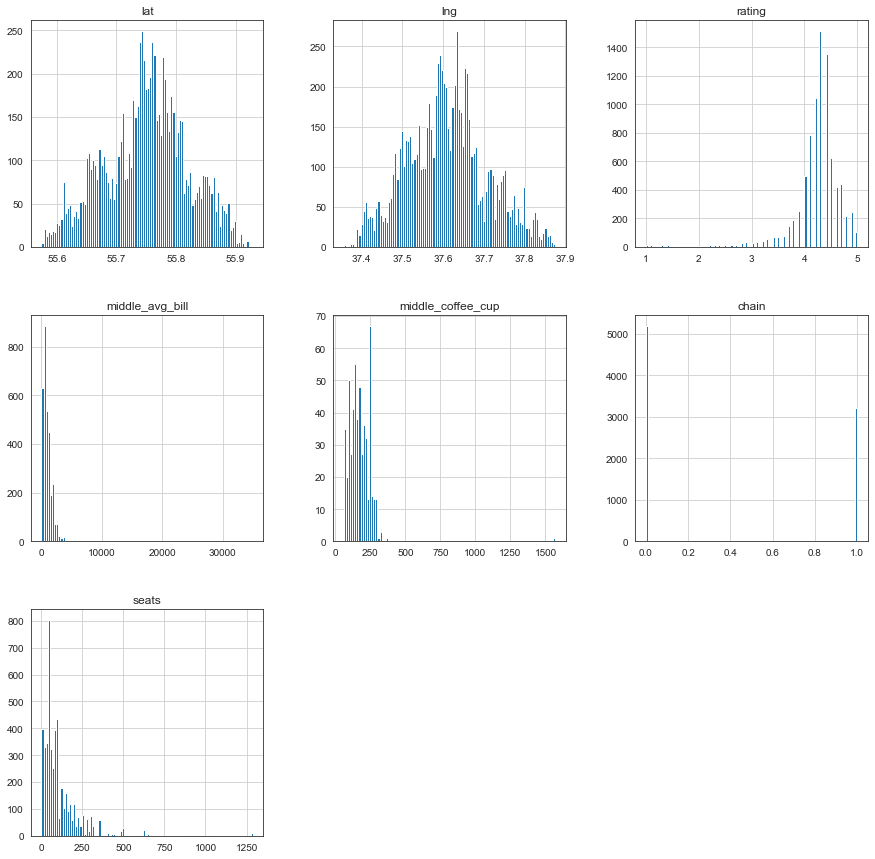

In [86]:
# смотрю на распределение значений численного типа
data.hist(bins=100, figsize=(15, 15))

Вид распределения всех столбцов, кроме chain, нормальный. У колонок 'middle_avg_bill', 'middle_coffee_cup' и 'seats' видны выбивающиеся значения.

<AxesSubplot: >

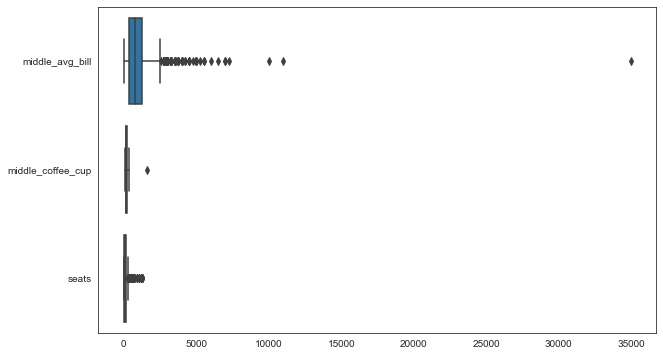

In [87]:
plt.figure(figsize=(10, 6))
sns.boxplot(data=data[['middle_avg_bill', 'middle_coffee_cup', 'seats']], 
           orient='h')

<div class="alert alert-warning">

**⚠️Комментарий ревьюера**
То есть средний чек размеров в 35000 рублей показался тебе нормальным значением? Стоило хотя бы посомтреть, что это за заведение и где оно находится. Исходя из этого уже подумать, можно ли его считать аномальным или нет</div>

Необходимости обрабатывать выбивающиеся значения нет, так как они в порядке вещей и не являются аномалиями.

**Выводы**:
- В датасете имеется информация про 8406 заведений и 13 столбцов с информацией про них;
- Найдены пропуски в шести столбцах;
- Явных дубликатов нет, но есть неявные.

## Предобработка данных

In [88]:
# заполняю пропуски значением "unknown"
data[['hours', 
      'price', 
      'avg_bill']] = data[['hours', 'price', 'avg_bill']].fillna('unknown')

Заполнил пропуски в столбцах с *временем работы*, *категорией цен в заведениях* и *средней стоимостью заказа* заглушкой "unknown". 

Обработать пропуски в столбцах со *средним чеком*, *стоимостью одной чашки капучино* и *количеством посадочных мест* не удалось, так как данные в этих столбцах имеют численный тип, и поэтому заполнение их средним или медианным значениями привело бы к искажению этих данных.

In [89]:
# заменил 1 и 0 на более понятные значения
data['chain'] = data['chain'].replace({0 : 'несетевое', 1 : 'сетевое'})
data['name'] = data['name'].replace('Яндекс.Лавка', 'Яндекс Лавка')

In [90]:
# добавляю столбец с информацией о том, работает ли заведение круглосуточное
data['is_24/7'] = data['hours'] == 'ежедневно, круглосуточно'
data['street'] = data['address'].str.split(',').str[1]

## Исследовательский анализ данных

### Категории заведений

In [91]:
sns.set_palette('tab20')

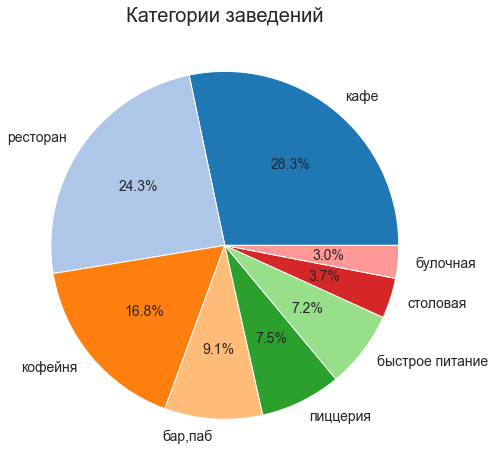

In [92]:
# строю круговую диаграмму по категориям заведений

(data
  .groupby('category')
  .agg({'name' : 'count'})
  .sort_values(by='name', ascending=False)
  .plot(
    kind='pie', 
    autopct='%1.1f%%',
    figsize=(8, 8), 
    subplots=True, 
    legend=False, 
    ylabel='', 
    fontsize=14)
)
plt.title('Категории заведений', fontsize=20)
plt.show()

Из 8406 предприятий общественного питания:
- **28,3%** или **2378** заведений - это *кафе*;
- **24,3%** или **2043** заведений - *ресторан*;
- **16,8%** или **1413** заведений - *кофейня*;
- **9,1%** или **765** заведений - *бар*, *паб*;
- **7,5%** или **633** заведений - *пиццерия*;
- **7,2%** или **603** заведений - *быстрое питание*;
- **3,7%** или **315** заведений - *столовая*;
- **3,0%** или **256** заведений - *булочная*.

### Количество посадочных мест

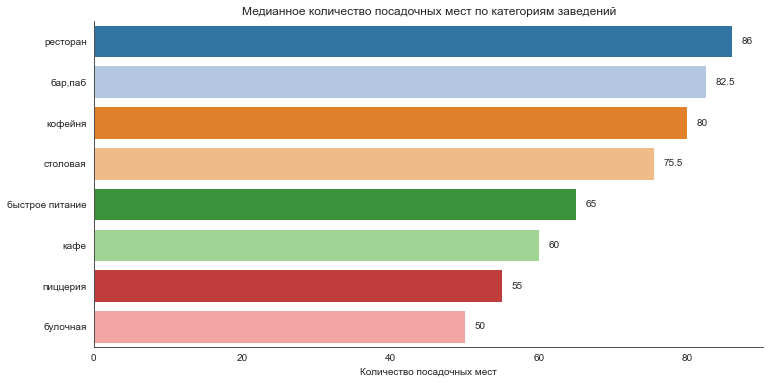

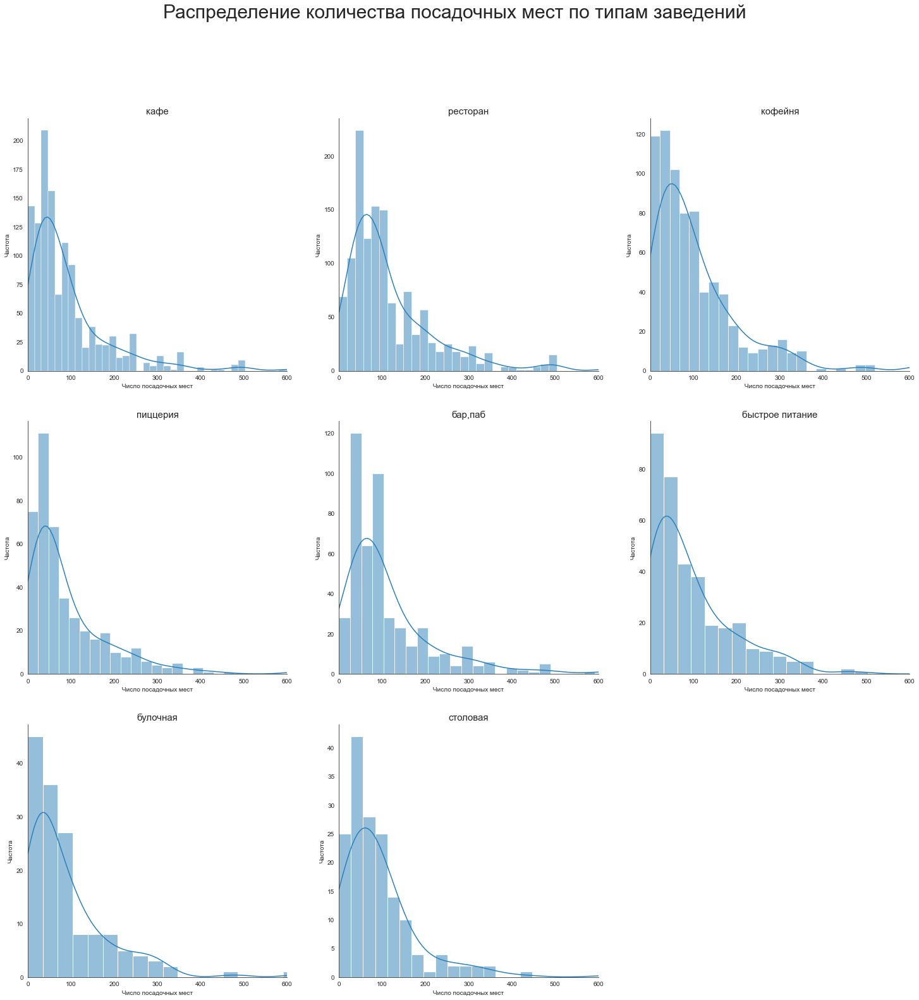

In [93]:
# строю столбчатую диаграмму
plt.figure(figsize=(12, 6))

ax = sns.barplot(
    data=data, 
    x='seats', 
    y='category', 
    estimator=np.median,
    ci=None,
    order=data\
            .groupby('category')\
            .agg({'seats':'median'})\
            .sort_values(by='seats', ascending=False)\
            .index
)
plt.title('Медианное количество посадочных мест по категориям заведений')
ax.bar_label(ax.containers[0], padding=10)
plt.ylabel('')
plt.xlabel('Количество посадочных мест')
sns.despine(top=True, right=True, left=False)
plt.show()

# строю гистограммы по категориям
plt.figure(figsize=(25, 25))
for count, category in enumerate(data['category'].unique()):
    sns.histplot(
        data=data.query('category == @category'),
        x='seats',
        kde=True, 
        ax=plt.subplot(3, 3, count + 1), 
        color='#2c7fb8'
    )
    plt.title(f'{category}', fontsize=15)
    plt.ylabel('Частота')
    plt.xlabel('Число посадочных мест')
    sns.despine(top=True, right=True)
    plt.xlim(0, 600)
plt.suptitle('Распределение количества посадочных мест по типам заведений', fontsize=30)
plt.show()

### Распределение сетевых и несетевых заведений

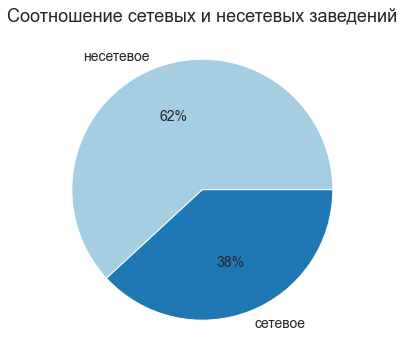

In [94]:
with sns.color_palette('Paired'):
    (data
        .groupby('chain')
        .agg({'name':'count'})
        .plot(
            kind='pie', 
            subplots=True, 
            autopct='%1.0f%%', 
            figsize=(6, 6), 
            legend=False, 
            fontsize=14, 
            textprops={'fontsize':14}
        )
    )
    plt.title('Соотношение сетевых и несетевых заведений', fontsize=18)
    plt.ylabel('')
    plt.show()

**62%** и **32%** составляют *несетевые* и *сетевые* заведения соответственно.

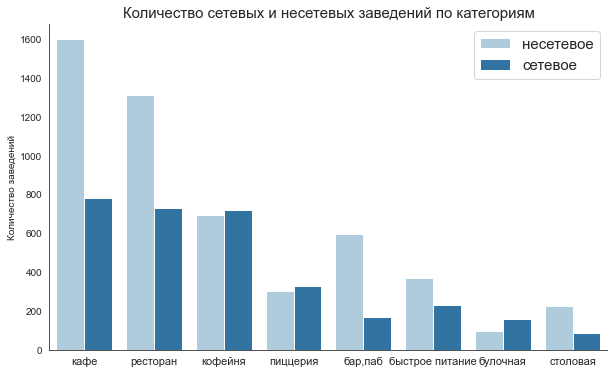

In [95]:
with sns.color_palette('Paired'):
    plt.figure(figsize=(10, 6))
    sns.countplot(
        data=data, 
        x='category', 
        hue='chain',
    )
    plt.ylabel('Количество заведений', fontsize=10)
    plt.xlabel('')
    plt.title('Количество сетевых и несетевых заведений по категориям', fontsize=15)
    plt.xticks(fontsize=11)
    plt.legend(fontsize=15)
    sns.despine()
    plt.show()

В нижеперечисленных категориях несетевые заведения **превалируют**: 
   * *кафе* - несетевых заведений в **2** раза больше;
   * *ресторан* - несетевых заведений в **1,8** раза больше;
   * *бар,паб* - несетевых заведений в **3,5** раза больше; 
   * *быстрое питание* - несетевых заведений в **1,6** раза больше;
   * *столовая* - несетевых заведений в **2,6** раза больше.

Сетевых заведений **больше** в этих категориях:
   * *кофейня* - сетевые составляют **51%** от числа всех заведений;
   * *пиццерия* - сетевые составляют **52,3%** от числа всех заведений;
   * *булочная* - сетевые составляют лишь **61,3%** от числа всех заведений.

### Анализ популярных сетей

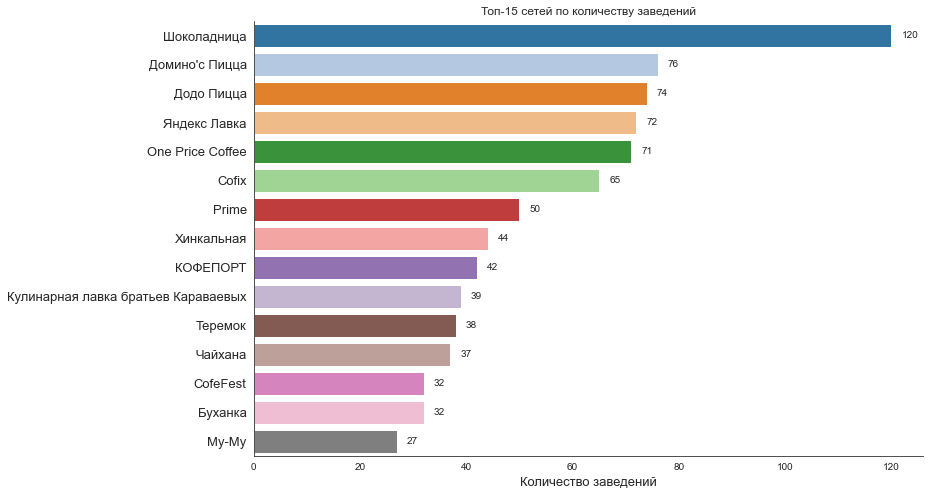

In [139]:
# строю столбчатую диаграмму
plt.figure(figsize=(12, 8))

ax = sns.barplot(
    data=(
    data
        .query('chain == "сетевое"')
        .groupby('name', as_index=False)
        .agg(count=('name', 'count'))
        .sort_values(by='count', ascending=False)
        .head(15)
        .sort_values(by='count', ascending=False)
), 
    x='count', 
    y='name', 
)
plt.title('Топ-15 сетей по количеству заведений')
ax.bar_label(ax.containers[0], padding=10)
plt.ylabel('')
plt.xlabel('Количество заведений', fontsize=13)
plt.yticks(fontsize=13)
sns.despine()
plt.show()


In [97]:
top_15 = data[
    data['name'].isin(data # отбираю топ 15 сетей
        .query('chain == "сетевое"')
        .groupby('name')
        .agg(count=('name', 'count'))
        .sort_values('count', ascending=False)
        .head(15)
        .index)
].groupby(['district', 'category'], as_index=False)\
 .agg(count=('name', 'count'))

# считаю долю категории от общего заведения по району
top_15['percent'] = round(
    (top_15['count'] / 
    top_15.groupby('district')['count']
            .transform('sum')) * 100, 2)

In [98]:
fig = px.bar(
    top_15, 
    x='count', 
    y='district', 
    color='category', 
    orientation='h',
    height=500, 
    width=1000,
    hover_data=['category', 'count', 'percent']
)
fig.update_layout(
    title='Распределение топ-15 сетей общепита в Москве',
    xaxis_title='Количество заведений',
    yaxis_title='',
    legend_title='Категории заведений', 
    yaxis={'categoryorder':'total ascending'}
)
fig.show()

In [99]:
# рассчитываю среднюю долю кофеен по всем районам
(
    top_15
        .query('category == "кофейня"')
        .agg({'percent':'mean'})
)

percent    39.946667
dtype: float64

In [100]:
# рассчитываю среднюю долю кофеен по всем районам, кроме 
# Центрального и Юго-Восточного районов
top_15.loc[
    (top_15['category'] == 'кофейня') &
    (top_15['district'] != 'Центральный административный округ') &
    (top_15['district'] != 'Юго-Восточный административный округ'), 
    'percent'
].mean()

41.287142857142854

**Выводы**:
- Распределение сетевых заведений по районам во многом схожа с картиной по всему датасету;
- В разы больше заведений в Центральном районе;
- Во всех районах кофейни составляют значительную часть от общего числа заведений крупных сетей:
        - самая большая доля кофеен в Центральном районе -- 44%;
        - самая низкая доля в Юго-Восточном районе - 26,8%;
        - в остальных районах средняя доля - 41,5%.

### Анализ по административным районам Москвы

In [101]:
district = (
    data
        .groupby(['district', 'category'], as_index=False)
        .agg(count=('name', 'count'))
)

# считаю долю категории от общего заведения по району
district['percent'] = round((district['count'] / 
    district.groupby('district')['count']
            .transform('sum')) * 100, 2)

В *Центральном* округе в разы больше заведений, чем в любом другом.

In [102]:
fig = px.bar(
    district, 
    x='count', 
    y='district', 
    color='category', 
    orientation='h',
    height=500, 
    width=1000,
    hover_data=['category', 'count', 'percent']
)
fig.update_layout(
    title='Количество заведений по районам Москвы',
    xaxis_title='Количество заведений',
    yaxis_title='',
    legend_title='Категории заведений', 
    yaxis={'categoryorder':'total ascending'}
)
fig.show()

**Вывод**:
- В общем распределения заведений по категориям во всех районах похожи;
- Значительная часть заведений являются *кафе* и *ресторанами*;
- Стоит отметить, что в *Центральном округе* самая большая доля баров (**16,04**) среди всех районов.

### Анализ рейтингов заведений

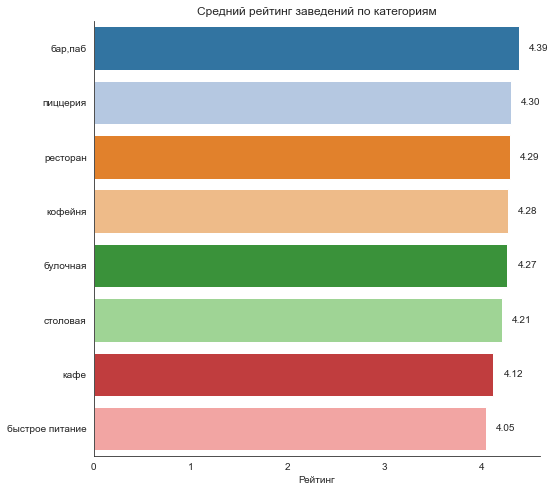

In [103]:
plt.figure(figsize=(8, 8))
ax = sns.barplot(
    data=data,
    y='category', 
    x='rating', 
    ci=None, 
    order=data.groupby('category').agg({'rating':'mean'}).sort_values('rating', ascending=False).index
)
ax.bar_label(
    ax.containers[0], 
    padding=10, 
    fmt='%1.2f'
)
plt.ylabel('')
sns.despine()
plt.title('Средний рейтинг заведений по категориям')
plt.xlabel('Рейтинг')
plt.show()

Усредненные рейтинги по категориям не сильно различаются:
- Наибольший рейтинг у баров и пабов;
- Наименьший -- у заведений быстрого питания.

In [104]:
# загружаю файл с границами округов Москввы
state_geojson = 'admin_level_geomap.geojson'

with open(state_geojson, encoding='utf-8') as f:
    state_geo = json.load(f)

In [140]:
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаю карту Москвы
m = folium.Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаю хороплет
folium.Choropleth(
    geo_data = state_geo, 
    name='choropleth', 
    data=data.groupby('district', as_index=False).agg({'rating' : 'mean'}), 
    columns=['district', 'rating'], 
    key_on='feature.name', 
    fill_color='YlOrBr', 
    fill_opacity=0.8, 
    legend_name='Средний рейтинг по районам Москвы'
).add_to(m)

# добавляю все заведения на карту с помощью кластеров
marker_cluster = MarkerCluster().add_to(m)

def create_clusters(row):
    folium.Marker(
        [row['lat'], row['lng']], 
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)
    
data.apply(create_clusters, axis=1)

m

Выводы:
- Самый высокий рейтинг заведений в *Центральном* округе - **4,38** баллов;
- Самый низкий в *Юго-Восточном* округе - **4,10** баллов.

### Анализ топ-15 улиц

In [108]:
# считаю заведения по категориям и улицам, на которых они находятся
streets_data = (
    data[
        data['street'].isin(
            data # отбираю топ-15 улиц по числу заведений
                .groupby('street')
                .agg({'name':'count'})
                .sort_values('name', ascending=False)
                .head(15)
                .index)
    ].groupby(['street', 'category'], as_index=False)
     .agg(count=('name', 'count'))
)
# считаю долю заведений данной категории от общего числа заведения по району
streets_data['percent'] = round(100 * (
    streets_data['count'] / 
    streets_data.groupby('street')['count'].transform('sum')), 2)

In [109]:
fig = px.bar(
    streets_data, 
    x='count', 
    y='street', 
    color='category', 
    orientation='h',
    height=500, 
    hover_data=['category', 'count', 'percent']
)
fig.update_layout(
    title='Топ 15 улиц по количеству улиц',
    xaxis_title='Количество заведений',
    yaxis_title='',
    legend_title='Категории заведений', 
    yaxis={'categoryorder':'total ascending'}
)
fig.show()

Выводы:
- По графику можем видеть, что среди всех улиц выделяется проспект Мира -- на этой улице расположено больше всего заведений;
- Почти на всех улицах значительную часть заведений составляют *кафе* и *рестораны*;
- По структуре общепита выделяется *МКАД*, на которой **69,2%** заведений являются кафе, а пиццерий нет вовсе.

### Анализ улиц только с одним заведением

In [110]:
# отбираю информацию по заведению, являющимися единственными на улице
one_street_places = data[data['street'].isin((
    data
        .groupby('street')
        .agg({'name' : 'count'})
        .query('name == 1')
).index)]

Всего насчитывается 458 улиц, на которых расположен только один объект общепита.

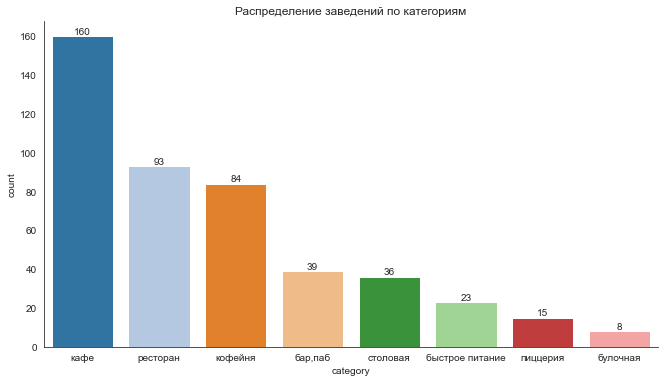

In [111]:
plt.figure(figsize=(11, 6))
ax=sns.countplot(
    data=one_street_places,
    x='category', 
    order=one_street_places\
                .groupby('category')\
                .agg({'name':'count'})\
                .sort_values('name', ascending=False)\
                .index
)
plt.title('Распределение заведений по категориям')
ax.bar_label(ax.containers[0])
sns.despine()
plt.show()

Заведения, являющимися единственными объектами общепита на улице, в целом не отличаются от других заведений распределению по категориям.

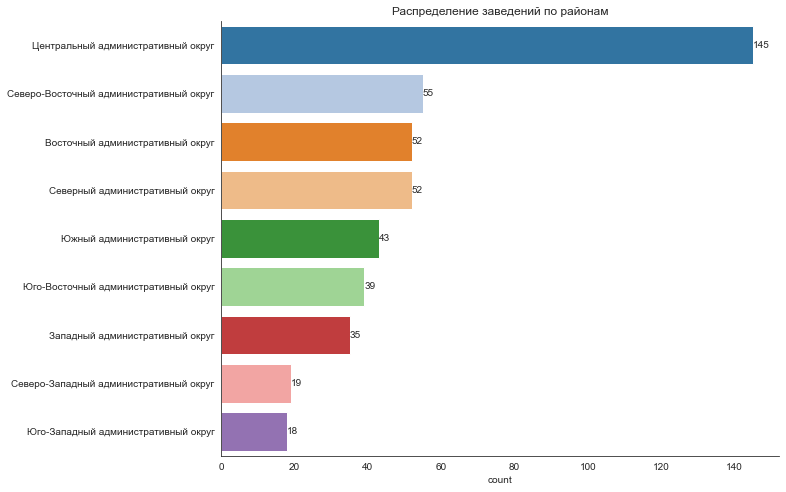

In [112]:
plt.figure(figsize=(10, 8))
ax=sns.countplot(
    data=one_street_places,
    y='district', 
    order=one_street_places\
                .groupby('district')\
                .agg({'name':'count'})\
                .sort_values('name', ascending=False)\
                .index
)
plt.title('Распределение заведений по районам')
ax.bar_label(ax.containers[0])
plt.ylabel('')
sns.despine()
plt.show()

Такие заведения находятся во всех районах. Причем, распределения сильно не отличается в сравнении с остальным датасетом.

### Анализ среднего чека

In [113]:
# создаю карту Москвы
m2 = folium.Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаю хороплет
folium.Choropleth(
    geo_data = state_geo, 
    name='choropleth', 
    data=(data
     .groupby('district', as_index=False)
     .agg(median_bill=('middle_avg_bill', 'median'))
     .sort_values('median_bill', ascending=False)
), 
    columns=['district', 'median_bill'], 
    key_on='feature.name', 
    fill_color='YlOrBr', 
    fill_opacity=0.8, 
    legend_name='Медианный чек по районам Москвы'
).add_to(m2)

m2

По карте видим, что в центральной и западных части города медианный чек выше.

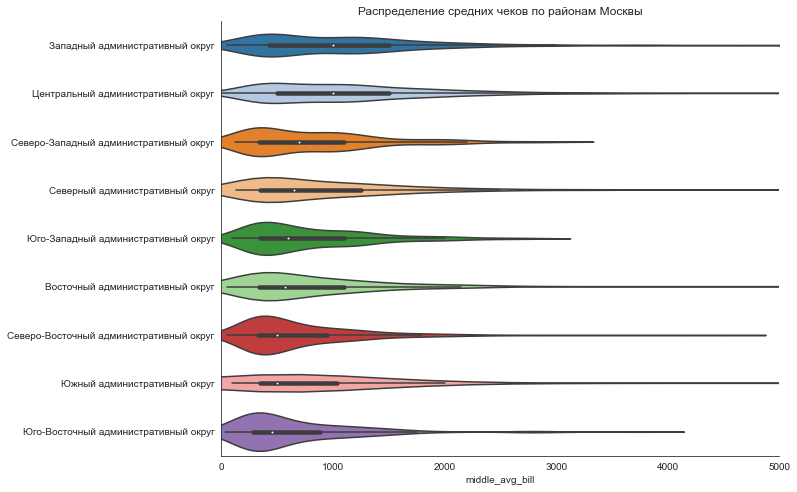

In [114]:
plt.figure(figsize=(10, 8))
sns.violinplot(
    data=data,
    x='middle_avg_bill', 
    y='district',
    order=data\
            .groupby('district')\
            .agg({'middle_avg_bill':'median'})\
            .sort_values('middle_avg_bill', ascending=False)\
            .index
)
plt.title('Распределение средних чеков по районам Москвы')
plt.xlim(0, 5000)
plt.ylabel('')
sns.despine()
plt.show()

In [115]:
np.nanpercentile(data['middle_avg_bill'], [68, 90, 95])

array([1100., 2000., 2250.])

**Выводы**:
- Две трети средних чеков меньше или равно 1100 рублей;
- 95% чеков меньше или равно 2250 рублей;
- Дешевле всего можно поесть в *Юго-Восточном* округе;
- Дороже - в *Центральном* и *Западном* округах.

### Изучение влияния расстояния до центра на средний чек

In [116]:
# рассчитываю расстояние до центра в километрах для каждого заведения
data['distance_to_center'] = data.apply(
    lambda x: haversine(x[['lat', 'lng']], [moscow_lat, moscow_lng]), 
    axis=1
)

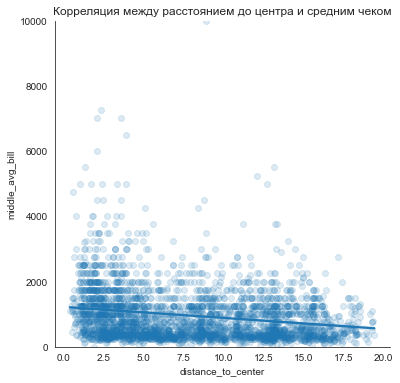

Корреляция Пирсона: -0.16441635129805104


In [117]:
plt.figure(figsize=(6, 6))
sns.regplot(
    data=data, 
    x='distance_to_center', 
    y='middle_avg_bill',
    scatter_kws={'alpha':0.15}
)
sns.despine()
plt.ylim(0, 10000)
plt.title('Корреляция между расстоянием до центра и средним чеком')
plt.show()

print('Корреляция Пирсона:', data['middle_avg_bill'].corr(data['distance_to_center']))

Как по графику, так и коэффициент корреляции Пирсона говорит, что никакой взаимосвязи между расстоянием до центра и средним чеком нет.

### Вывод

1. **Категории заведений**

В датасете представлены 8 категорий заведений:
- **28,3%** или **2378** заведений - это *кафе*;
- **24,3%** или **2043** заведений - *ресторан*;
- **16,8%** или **1413** заведений - *кофейня*;
- **9,1%** или **765** заведений - *бар*, *паб*;
- **7,5%** или **633** заведений - *пиццерия*;
- **7,2%** или **603** заведений - *быстрое питание*;
- **3,7%** или **315** заведений - *столовая*;
- **3,0%** или **256** заведений - *булочная*.

2. **Количество посадочных мест**

Вероятно, что количество посадочных мест зависит от функции заведения:
- Если основная функция заведения -- это быстро произвести блюдо, например, пиццерия, то в этом заведении будет меньше посадочных мест;
- А если основная функция -- это место для приятного времяпрепровождения, например, ресторан, то будет больше посадочных мест.

Дополнительные немаловажные инсайты:

- **95%** всех заведений имеют до 307 мест включительно;
- **68%** всех заведений имеет до 100 мест включительно.

3. **Сетевые и несетевые заведения**

В целом, **62%** и **32%** составляют *несетевые* и *сетевые* заведения соответственно.

Если рассмотреть по категориям, то в *кофейнях*, *пиццериях* и *булочных* слегка больше сетевых заведений, а в остальных категориях несетевые заведения доминируют:

- *кафе* - несетевых заведений в **2** раза больше;
- *ресторан* - несетевых заведений в **1,8** раза больше;
- *бар,паб* - несетевых заведений в **3,5** раза больше;
- *быстрое питание* - несетевых заведений в **1,6** раза больше;
- *столовая* - несетевых заведений в **2,6** раза больше.

4. **Анализ топ-15 сетей**

Среди топ-15 встречаются:
- 5 сетей кофеен;
- 3 сети кафе;
- 3 сети ресторанов (одна из них - Яндекс Лавка);
- 2 сети пиццерий;
- 1 сеть булочных;
- 1 сеть быстрого питания.

В этом списке есть 7 сетей (пиццерия, кофейни, булочные), чьи заведения специализированы на приготовлении одного типа продукта в больших масштабах.

Распределение сетевых заведений по районам во многом схожа с картиной по всему датасету;
В разы больше заведений в Центральном районе;
Во всех районах кофейни составляют значительную часть от общего числа заведений крупных сетей:
  - самая большая доля кофеен в Центральном районе -- 44%;
  - самая низкая доля в Юго-Восточном районе - 26,8%;
  - в остальных районах средняя доля - 41,5%.

5. **Анализ по районам Москвы**

- Центральный административный округ - 2242 заведений;
- Северный административный округ - 900 заведений;
- Южный административный округ - 892 заведений;
- Северо-Восточный административный округ - 891 заведений;
- Западный административный округ - 851 заведений;
- Восточный административный округ - 798 заведений;
- Юго-Восточный административный округ - 714 заведений;
- Юго-Западный административный округ - 709 заведений;
- Северо-Западный административный округ - 409 заведений;
    
В общем, распределения заведений по категориям одного района не сильно отличается от другого.
    
6. **Анализ рейтинга заведений**

Средний рейтинг заведений по категориям:
- бар,паб - 4.39 балла;
- пиццерия - 4.30 балла;
- ресторан - 4.29 балла;
- кофейня - 4.28 балла;
- булочная - 4.27 балла;
- столовая - 4.21 балла;
- кафе - 4.12 балла;
- быстрое питание - 4.05 балла.

Рейтинг в Центральном и Западных округах выше, чем в восточных.

7. **Топ-15 улиц по количеству заведений, расположенных на них**

- Почти на всех улицах значительную часть заведений составляют *кафе* и *рестораны*;
- По структуре общепита выделяется *МКАД*, на которой **69,2%** заведений являются кафе, а пиццерий нет вовсе.

8. **Анализ заведений, которые являются единственными объектами общепита на улице**

- Всего насчитывается 458 улиц, на которых расположен только один объект общепита.
- Такие заведения в целом не отличаются от других заведений  и находятся во всех районах.

9. **Анализ среднего чека**

- Две трети средних чеков меньше или равно 1100 рублей;
- 95% чеков меньше или равно 2250 рублей;
- Дешевле всего можно поесть в *Юго-Восточном* округе;
- Дороже - в *Центральном* и *Западном* округах

10. ****Изучение влияния расстояния до центра на средний чек****

- Взаимосвязи между близостью к центру и величиной среднего чека выявлено не было.

## Открытие кофейни

### Обзор данных

Фокусирую направление данного исследование на кофейнях.

In [118]:
# создаю отдельный датафрейм с информацией о кофейнях
coffee_data = data.query('category == "кофейня"')

In [119]:
coffee_data.shape[0]

1413

В датасете 1413 кофеен.

In [120]:
coffee_data.isna().sum()

name                     0
category                 0
address                  0
district                 0
hours                    0
lat                      0
lng                      0
rating                   0
price                    0
avg_bill                 0
middle_avg_bill       1213
middle_coffee_cup      892
chain                    0
seats                  662
is_24/7                  0
street                   0
distance_to_center       0
dtype: int64

Содержится значительное количество пропусков в важных столбцах с средним чеком и ценой одной чашки капучино.

### Анализ по районам Москвы

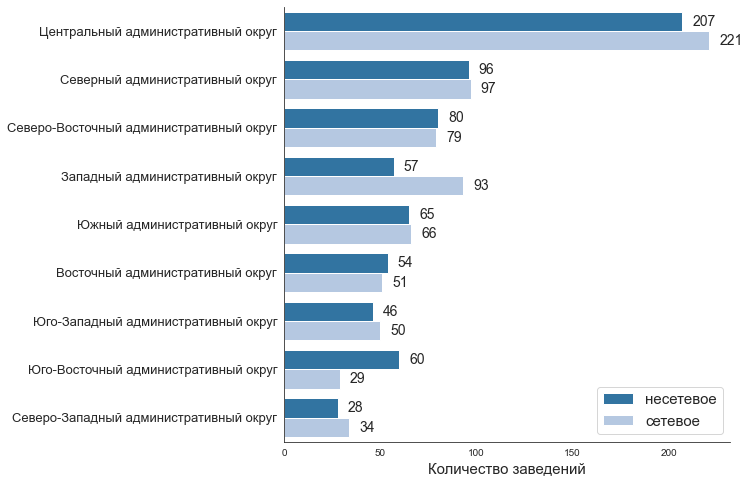

In [121]:
plt.figure(figsize=(8, 8))
ax = sns.countplot(
    data=coffee_data, 
    y='district',
    hue='chain', 
    order=coffee_data\
            .groupby('district')\
            .agg({'name' : 'count'})\
            .sort_values('name', ascending=False)\
            .index
)
sns.despine()
plt.ylabel('')
plt.xlabel('Количество заведений', fontsize=15)
plt.yticks(fontsize=13)
#plt.title('Количество кофеен в районах Москвы')
for container in ax.containers:
    ax.bar_label(container, padding=10, fontsize=14)
plt.legend(fontsize=15)
plt.show()

In [122]:
print(
    coffee_data\
            .groupby('district')\
            .agg({'name' : 'count'})\
            .sort_values('name', ascending=False)
)

                                         name
district                                     
Центральный административный округ        428
Северный административный округ           193
Северо-Восточный административный округ   159
Западный административный округ           150
Южный административный округ              131
Восточный административный округ          105
Юго-Западный административный округ        96
Юго-Восточный административный округ       89
Северо-Западный административный округ     62


В *Центральном* округе многократно больше кофеен, чем в любом другом районе.

<div class="alert alert-warning">

**⚠️Комментарий ревьюера**
Здесь я бы показал не просто абсолютное кол-во круглосуточных заведений, а долю</div>

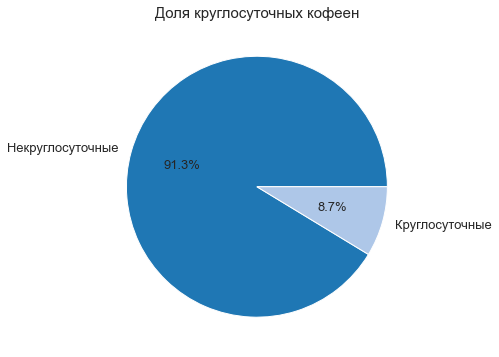

In [123]:
(
    data['is_24/7']
        .value_counts()
        .plot(kind='pie', 
              subplots=True, 
             figsize=(6, 6), 
             autopct='%1.1f%%',
             legend=False, 
             labels=['Некруглосуточные', 'Круглосуточные'],
             fontsize=13
             )
)
plt.title('Доля круглосуточных кофеен', fontsize=15)
plt.ylabel('')
plt.show()

Доля круглосуточных кофеен составляет **8,7%**.

### Анализ рейтингов кофеен

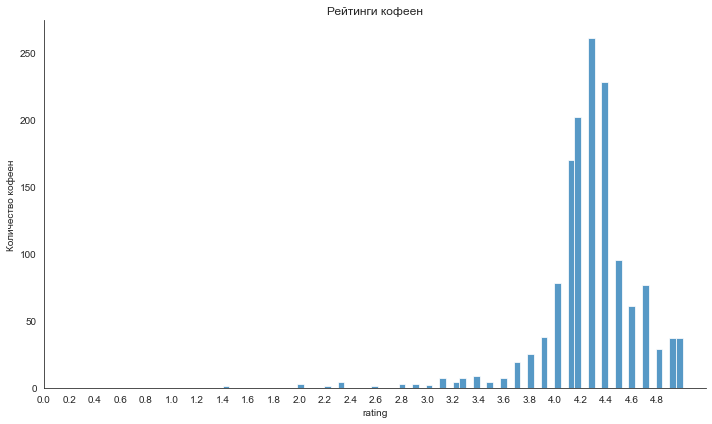

In [124]:
plt.figure(figsize=(10, 6))
sns.histplot(
    data=coffee_data, 
    x='rating'
)
plt.ylabel('Количество кофеен')
sns.despine()
plt.title('Рейтинги кофеен')
plt.xticks(np.arange(0, 5, 0.2))
plt.tight_layout()
plt.show()

In [125]:
np.nanpercentile(coffee_data['rating'], [68, 90, 95])

array([4.4, 4.7, 4.9])

**Выводы**:
- 68% процентов заведений имеют рейтинг не ниже **4,4** баллов;
- 90% процентов заведений имеют рейтинг не ниже **4,7** баллов;
- 95% процентов заведений имеют рейтинг не ниже **4,9** баллов.

In [126]:
# создаю карту Москвы
m5 = folium.Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаю хороплет
folium.Choropleth(
    geo_data = state_geo, 
    name='choropleth', 
    data=(coffee_data
     .groupby('district', as_index=False)
     .agg(mean_rating=('rating', 'mean'))
#     .sort_values('mean_rating', ascending=False)
), 
    columns=['district', 'mean_rating'], 
    key_on='feature.name', 
    fill_color='YlOrBr', 
    fill_opacity=0.8, 
    legend_name='Средний рейтинг кофеен'
).add_to(m5)

m5

Самый высокий рейтинг у *Центрального* района - **4,34**, а самый низкий -- у **Западного** округа с рейтингом **4,2**.

### Анализ цен одной чашки кофе

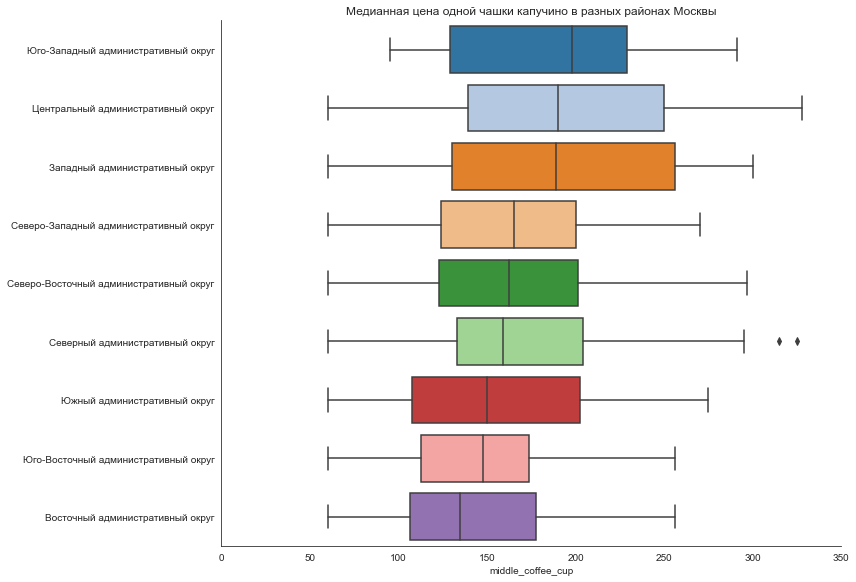

array([205., 256.])

In [127]:
plt.figure(figsize=(12, 8))
ax = sns.boxplot(
    data=coffee_data, 
    y='district',
    x='middle_coffee_cup',
    order=coffee_data\
            .groupby('district')\
            .agg({'middle_coffee_cup' : 'median'})\
            .sort_values('middle_coffee_cup', ascending=False)\
            .index)
sns.despine()
plt.xlim(0, 350)
plt.ylabel('')
plt.tight_layout()
plt.title('Медианная цена одной чашки капучино в разных районах Москвы')
plt.show()

np.nanpercentile(coffee_data['middle_coffee_cup'], [68, 90])

In [128]:
# создаю карту Москвы
m5 = folium.Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаю хороплет
folium.Choropleth(
    geo_data = state_geo, 
    name='choropleth', 
    data=(coffee_data
     .groupby('district', as_index=False)
     .agg({'middle_avg_bill':'mean'})
), 
    columns=['district', 'middle_avg_bill'], 
    key_on='feature.name', 
    fill_color='YlOrBr', 
    fill_opacity=0.8, 
    legend_name='Средний чек'
).add_to(m5)

m5

**Выводы**:
- Больше всего платят за кофе в Центральном и Западных районах;
- Меньше всего платят за кофе в Восточных районах.
- В 68% кофеен цена одной чашки кофе меньше или равна 205 рублей;
- В 90% кофеен цена одной чашки кофе меньше или равна 256 рублей.

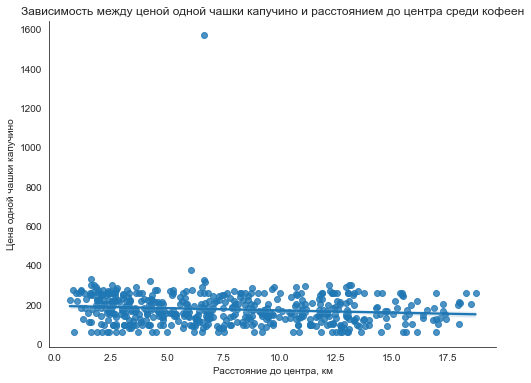

Коэффициент корреляции: -0.11583717414926303


In [129]:
plt.figure(figsize=(8, 6))
sns.regplot(
    data=coffee_data, 
    y='middle_coffee_cup', 
    x='distance_to_center'
)
plt.title('Зависимость между ценой одной чашки капучино и расстоянием до центра среди кофеен')
plt.ylabel('Цена одной чашки капучино')
plt.xlabel('Расстояние до центра, км')
sns.despine()
#plt.xlim(0, 15)
#plt.xticks(range(0, 20))
plt.show()

print('Коэффициент корреляции:', 
     coffee_data['middle_coffee_cup'].corr(coffee_data['distance_to_center'])
)

Как по графику, так и по коэффициенту корреляции можно сказать, что не наблюдается взаимосвязи между ценой одной чашки капучино и расстоянием до центра города.

### Анализ средних чеков кофеен

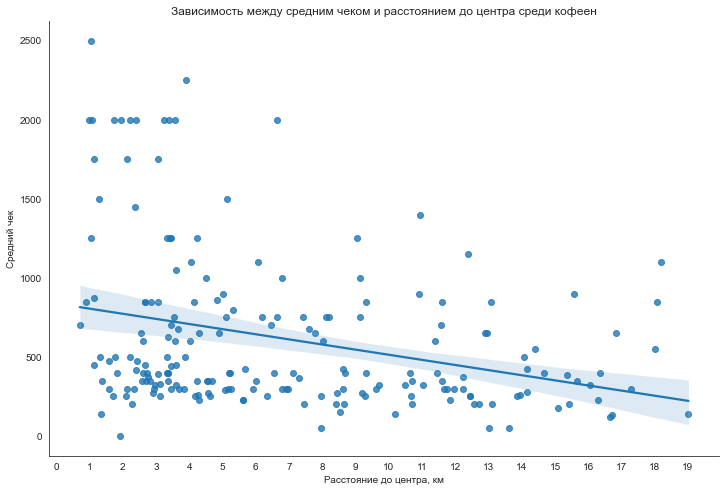

Коэффициент корреляции: -0.3047922207963303


In [130]:
plt.figure(figsize=(12, 8))
sns.regplot(
    data=coffee_data, 
    y='middle_avg_bill', 
    x='distance_to_center'
)
plt.title('Зависимость между средним чеком и расстоянием до центра среди кофеен')
plt.ylabel('Средний чек')
plt.xlabel('Расстояние до центра, км')
sns.despine()
#plt.xlim(0, 15)
plt.xticks(range(0, 20))
plt.show()

print('Коэффициент корреляции:', 
     coffee_data['middle_avg_bill'].corr(coffee_data['distance_to_center'])
)

**Выводы**:
- График и коэффициент корреляции показывает, что существует отрицательная корреляция между средним чеком и расстоянием до центра;
- Кажется, у кофеен, находящиеся на расстоянии не более 6 км от центра, средний чек выше, чем у кофеен, расположенные дальше 6 км от центра.

### Проверка гипотезы

Возникла гипотеза, что у кофеен, находящиеся на расстоянии 6 км, средний чек больше. Ее я и хочу проверить.

In [131]:
# создаю отдельный датасет и удаляю пропуски в нужных столбцах
# до 6 км
km_6 = (
    coffee_data
            .query('distance_to_center < 6')
            .dropna(subset=['middle_avg_bill'])
            .middle_avg_bill
)
# больше 6 км
km_more_6 = (
    coffee_data
        .query('distance_to_center >= 6')
        .dropna(subset=['middle_avg_bill'])
        .middle_avg_bill
)

После 6 километров
count      93.000000
mean      472.666667
std       333.643729
min        50.000000
25%       250.000000
50%       350.000000
75%       650.000000
max      2000.000000
Name: middle_avg_bill, dtype: float64

До 6 километров
count     107.000000
mean      737.233645
std       584.726005
min         0.000000
25%       327.500000
50%       475.000000
75%       867.500000
max      2500.000000
Name: middle_avg_bill, dtype: float64


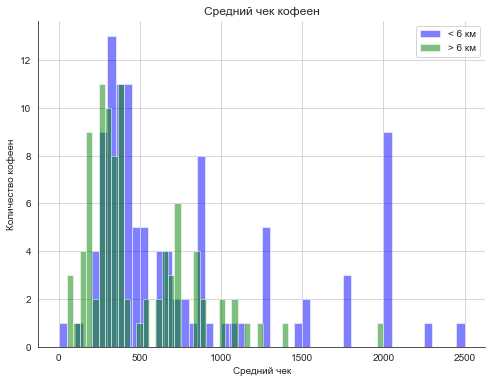

In [132]:
print('После 6 километров', km_more_6.describe(), sep='\n')
print()
print('До 6 километров', km_6.describe(), sep='\n')

sns.set_style('white')
plt.figure(figsize=(8, 6))
km_6.hist(
    bins=50, 
    alpha=0.5, 
    color='blue', 
    label='< 6 км'
)
km_more_6.hist(
    bins=50, 
    alpha=0.5, 
    color='green', 
    label='> 6 км'
)
sns.despine()
plt.xlabel('Средний чек')
plt.ylabel('Количество кофеен')
plt.title('Средний чек кофеен')
plt.legend()
plt.show()

Размер двух выборок 93 и 107 соответственно. И среднее отклонение у выборки с кофейнями до 6 км больше почти в два раза, что можно заметить на графике -- колокол ранееуказанной выборки шире.

Проведу тест Шапиро-Уилка для проверки двух выборки на нормальность. 

`H 0: выборка распределена нормально`

`H A: выборка распределена ненормально`

In [133]:
# проверяю выборку с кофейнями до 6 км
results = st.shapiro(km_6) #вызов метода для проверки гипотезы

alpha = 0.05 # задайте значение уровня значимости

# вывод значения p-value на экран 
print(results.pvalue)
# условный оператор с выводом строки с ответом
if results.pvalue < alpha:
    print('Отвергаем нулевую гипотезу')
else:
    print('Не получилось отвергнуть нулевую гипотезу')

1.1631047514004678e-10
Отвергаем нулевую гипотезу


In [134]:
# проверяю выборку с кофейнями до 6 км
results = st.shapiro(km_more_6) #вызов метода для проверки гипотезы

alpha = 0.05 # задайте значение уровня значимости

# вывод значения p-value на экран 
print(results.pvalue)
# условный оператор с выводом строки с ответом
if results.pvalue < alpha:
    print('Отвергаем нулевую гипотезу')
else:
    print('Не получилось отвергнуть нулевую гипотезу')

2.503398555120384e-08
Отвергаем нулевую гипотезу


Тесты Шапиро-Уилка показали, что есть основания полагать, что обе выборки распределены не нормально.

Так как распределение выборок не нормально, тогда необходимо применить критерий Уилкоксона-Манна-Уитни для выявления статистически значимого различия в средних чеках.

`H 0: средние чеки обеих выборок равны`

`H A: средние чеки обеих выборок не равны`

In [135]:
results = st.mannwhitneyu(km_6, km_more_6) #вызов метода для проверки гипотезы

alpha = 0.05 # задайте значение уровня значимости

# вывод значения p-value на экран 
print(results.pvalue)
# условный оператор с выводом строки с ответом
if results.pvalue < alpha:
    print('Отвергаем нулевую гипотезу')
else:
    print('Не получилось отвергнуть нулевую гипотезу')

0.000279725706560086
Отвергаем нулевую гипотезу


Есть основания отвергнуть нулевую гипотезу о том, что средние чеки кофеен, расположенные на расстоянии менее и более 6 км, **не равны**. 

Проведу еще один тест, чтобы проверить, что чеки кофеен до 6 км больше:

`H 0: средние чеки обеих выборок равны`

`H A: средний чек кофеен, расположенные на расстоянии до 6 км от центра города, больше`

In [136]:
results = st.mannwhitneyu(
    km_6, 
    km_more_6, 
    alternative='greater'
) #вызов метода для проверки гипотезы

alpha = 0.05 # задайте значение уровня значимости

# вывод значения p-value на экран 
print(results.pvalue)
# условный оператор с выводом строки с ответом
if results.pvalue < alpha:
    print('Отвергаем нулевую гипотезу')
else:
    print('Не получилось отвергнуть нулевую гипотезу')

0.000139862853280043
Отвергаем нулевую гипотезу


Имеются основания сказать, что средний чек кофеен, расположенные на расстоянии менее 6 км от центра города, **больше**, чем у кофеен, находящиеся дальше 6 км.

<Figure size 576x432 with 0 Axes>

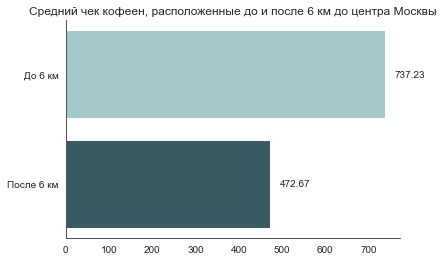

In [137]:
values = [km_more_6.mean(), km_6.mean()]
labels = ['После 6 км', 'До 6 км']

plt.figure(figsize=(8, 6))
fig, ax = plt.subplots()
bars = ax.barh(y=labels, width=values, color=['#395B64', '#A5C9CA'])

ax.bar_label(bars, padding=10, fmt='%1.2f')
plt.title('Средний чек кофеен, расположенные до и после 6 км до центра Москвы')
sns.despine()
plt.show()

In [138]:
(km_6.mean() - km_more_6.mean()) * 100 / km_more_6.mean()

55.973267600806714

Средний чек кофеен, расположенные ближе на 6 км к центру, больше на 56%, чем кофейни, которые находятся дальше 6 км от центра.

### Вывод

1. **Общая информация**

В датасете имеется информация про 1413 кофеен.  Больше всего кофеен в *Центральном* округе. Также насчитывается 59 круглосуточных и ежедневных кофеен.

```
- Центральный административный округ - 428 заведений;
- Северный административный округ - 193 заведений;
- Северо-Восточный административный округ - 159 заведений;
- Западный административный округ - 150 заведений;
- Южный административный округ - 131 заведений;
- Восточный административный округ - 105 заведений;
- Юго-Западный административный округ - 96 заведений;
- Юго-Восточный административный округ - 89 заведений;
- Северо-Западный административный округ - 62 заведений.
```

2. **Рейтинги заведений**
- 68% процентов заведений имеют рейтинг не ниже **4,4** баллов;
- 90% процентов заведений имеют рейтинг не ниже **4,7** баллов;
- 95% процентов заведений имеют рейтинг не ниже **4,9** баллов.

Рейтинг районов по среднему рейтингу:

```
- Центральный административный округ - 4.34;
- Северо-Западный административный округ - 4.33;
- Северный административный округ - 4.29;
- Юго-Западный административный округ - 4.28;
- Восточный административный округ - 4.28;
- Южный административный округ - 4.23;
- Юго-Восточный административный округ - 4.23;
- Северо-Восточный административный округ - 4.22;
- Западный административный округ - 4.20.
```

3. **Цена одной чашки капучино**
- Больше всего платят за кофе в Центральном и Западных районах;
- Меньше всего платят за кофе в Восточных районах.
- В 68% кофеен цена одной чашки кофе меньше или равна 205 рублей;
- В 90% кофеен цена одной чашки кофе меньше или равна 256 рублей.

Рейтинг районов по медианной цене одной чашки кофе:

```
- Юго-Западный административный округ - 198.0;
- Центральный административный округ - 190.0;
- Западный административный округ - 189.0;
- Северо-Западный административный округ - 165.0;
- Северо-Восточный административный округ - 162.5;
- Северный административный округ - 159.0;
- Южный административный округ - 150.0;
- Юго-Восточный административный округ - 147.5;
- Восточный административный округ - 135.0.
```

4. **Средний чек кофеен**
- Анализ показывает, что при увеличении расстояния от центра Москвы уменьшается средний чек кофеен;
- Также статистические тесты показали, что средний чек у кофеен, расположенные на расстоянии ближе 6 километров от центра города, больше, чем у кофеен, находящиеся дальше 6 километров.

### Рекомендации к открытию кофейни

Исходя из того, что заказчики не боятся конкуренции и хотят *открыть такую же крутую и доступную, как «Central Perk»*, мои предложения таковы:
- *Центральный округ* - в этом районе в среднем рейтинг и цена за чашку капучино выше, чем в любом районе Москвы;
- *Кофейня располагалась бы не дальше, чем 6 километров от центра* - на этом расстоянии средний чек кофеен выше на 56%, чем кофейни, расположенные дальше этой границы.

Презентация: <https://drive.google.com/file/d/1AIj9iXxIIJc4JFxx4n-BNrB4-5ip4k09/view?usp=share_link>